<a href="https://colab.research.google.com/github/FredLongo/Cancer_Detection_Project/blob/main/lung_cancer_detection_PC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# **Lung Cancer Detection**
   The purpose of this file it to take an 3D MRI image (multiple 2d Slices)  Run then by the Segmintation Model to get ROI areas containing nodules.  Then running the Noduls through the CNN Classifier to see if it is canceres.

*   Preps Environment
*   Preprocess Data
*   Load Unet Segmentation Model
*   Load CNN Classification Model
*   Prediction and get results

---

---
Prep Environment

---




In [ ]:
!pip install SimpleITK

In [ ]:
import os
import cv2
import copy
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm

import SimpleITK as stk
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import backend as K

from sklearn.cluster import KMeans
from skimage import measure

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd drive/MyDrive/PCAI_Project


[Errno 2] No such file or directory: 'drive/MyDrive/PCAI_Project'
/content/drive/MyDrive/PCAI_Project


In [ ]:
PATH = "subset0/"

---
Preprocess Data

---
In this section we take a file and preprocess this for models

In [ ]:
# This is the file we will predict on.

FILE = "1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.mhd"

In [ ]:
def load_mhd(file):
    mhdimage = stk.ReadImage(file)
    ct_scan = stk.GetArrayFromImage(mhdimage)
    origin = np.array(list(mhdimage.GetOrigin()))
    space = np.array(list(mhdimage.GetSpacing()))
    return ct_scan, origin, space

In [ ]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

In [ ]:
ct, origin, space = load_mhd(PATH+FILE)
print(ct.shape)

(161, 512, 512)


In [ ]:
num_z, height, width = ct.shape
ct_norm = cv2.normalize(ct, None, 0, 255, cv2.NORM_MINMAX)   # Normalizing the CT scan

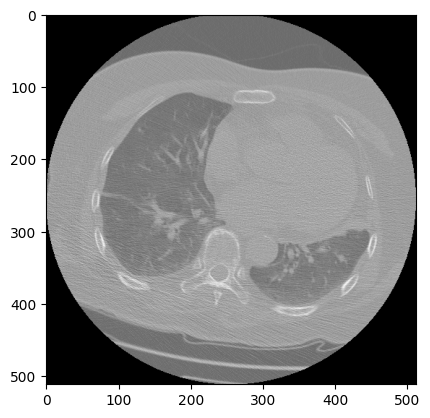

In [ ]:
plt.imshow(ct_norm[57], cmap="gray")

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))  # CLAHE(Contrast Limited Adaptive Histogram Equalization) filter for enhancing the contrast of an image
ct_norm_improved = []
for layer in ct_norm:
    ct_norm_improved.append(clahe.apply(layer.astype(np.uint8)))  # Applying CLAHE filter to the image

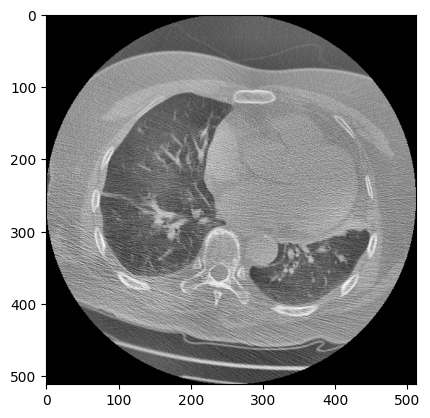

In [ ]:
plt.imshow(ct_norm_improved[57], cmap="gray")

In [ ]:
centeral_area = ct_norm_improved[len(ct_norm_improved)//2][100:400, 100:400]
kmeans = KMeans(n_clusters=2).fit(np.reshape(centeral_area, [np.prod(centeral_area.shape), 1]))
centroids = sorted(kmeans.cluster_centers_.flatten())
threshold = np.mean(centroids)
print(threshold)

127.49312861371418


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
lung_masks = []                                                                 ###Make a mask for each slice
for layer in ct_norm_improved:
    ret, lung_roi = cv2.threshold(layer, threshold, 255, cv2.THRESH_BINARY_INV)
    lung_roi = cv2.erode(lung_roi, kernel=np.ones([4,4]))                       ### remove small outliers and separate any connected tissue
    lung_roi = cv2.dilate(lung_roi, kernel=np.ones([13,13]))                    ### Dilates the mask to regain lung shape after eroding
    lung_roi = cv2.erode(lung_roi, kernel=np.ones([8,8]))                       #Erodes again with a medium-sized 8x8 kernel to smooth the lung shape

    labels = measure.label(lung_roi)        # Labelling different regions in the image
    regions = measure.regionprops(labels)   # Extracting the properties of the regions
    good_labels = []
    for prop in regions:        # Filtering the regions that are not too close to the edges
        B = prop.bbox           # Regions that are too close to the edges are outside regions of lungs
        if B[2]-B[0] < 475 and B[3]-B[1] < 475 and B[0] > 40 and B[2] < 472:
            good_labels.append(prop.label)
    lung_roi_mask = np.zeros_like(labels)
    for N in good_labels:
        lung_roi_mask = lung_roi_mask + np.where(labels == N, 1, 0)

    # Steps to get proper segmentation of the lungs without noise and holes
    contours, hirearchy = cv2.findContours(lung_roi_mask,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    external_contours = np.zeros(lung_roi_mask.shape)
    for i in range(len(contours)):
        if hirearchy[0][i][3] == -1:  #External Contours
            area = cv2.contourArea(contours[i])
            if area>518.0:
                cv2.drawContours(external_contours,contours,i,(1,1,1),-1)
    external_contours = cv2.dilate(external_contours, kernel=np.ones([4,4]))

    external_contours = cv2.bitwise_not(external_contours.astype(np.uint8))
    external_contours = cv2.erode(external_contours, kernel=np.ones((7,7)))
    external_contours = cv2.bitwise_not(external_contours)
    external_contours = cv2.dilate(external_contours, kernel=np.ones((12,12)))
    external_contours = cv2.erode(external_contours, kernel=np.ones((12,12)))

    external_contours = external_contours.astype(np.uint8)      # Final segmentated lungs mask
    lung_masks.append(external_contours)


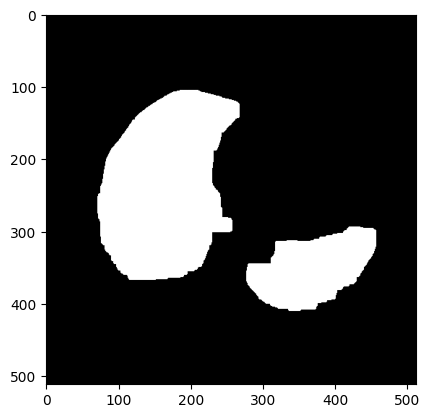

In [ ]:
plt.imshow(lung_masks[57], cmap="gray")

In [ ]:
extracted_lungs = []
for lung, mask in zip(ct_norm_improved,lung_masks):
    extracted_lungs.append(cv2.bitwise_and(lung, lung, mask=mask))

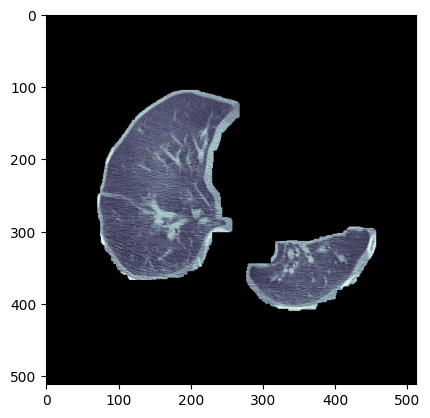

In [ ]:
plt.imshow(extracted_lungs[57], cmap="bone")

In [ ]:
X = np.array(extracted_lungs)
X.shape

(161, 512, 512)

In [ ]:
X = (X-127.0)/127.0
X = X.astype(np.float32)
X.dtype

dtype('float32')

In [ ]:
print("Min:",X.min(),"\nMax:",X.max())

Min: -1.0 
Max: 1.007874


In [ ]:
X = np.reshape(X, (len(X), 512, 512, 1))
X.shape

(161, 512, 512, 1)

---
Load The UNET Segmentation Model

---

In [ ]:
ls *.h*

checkpoint-001-0.000.hdf5  checkpoint_model.h5
checkpoint-001-0.217.hdf5  CNN-checkpoint.hdf5
checkpoint-001-0.229.hdf5  CNN_model_20230804_062028.h5
checkpoint-001-0.315.hdf5  CNN_model.h5
checkpoint-002-0.202.hdf5  FPR_classifier_model.h5
checkpoint-002-0.410.hdf5  LC_v4_UNet_cl.h5
checkpoint-003-0.189.hdf5  model.h5
checkpoint-004-0.477.hdf5  Seg_Model_20230803_005037.h5
checkpoint-005-0.592.hdf5  Seg_Model_20230804_045913.h5
checkpoint-007-0.579.hdf5  Seg_Model_Loss20230804_051845.h5
checkpoint-008-0.668.hdf5  Seg_Model_Loss.h5
checkpoint-010-0.690.hdf5  UNet_model.h5


In [ ]:
#model = tf.keras.models.load_model("UNet_model.h5", custom_objects={'dice_coef':dice_coef, 'dice_coef_loss':dice_coef_loss})
#model = tf.keras.models.load_model("Seg_Model_Loss20230804_051845.h5", custom_objects={'dice_coef':dice_coef, 'dice_coef_loss':dice_coef_loss})
model = tf.keras.models.load_model("Seg_Model_Loss.h5", custom_objects={'dice_coef':dice_coef, 'dice_coef_loss':dice_coef_loss})

---
Get the Predictions for the ROI Areas for the Segmentation Files.

---

In [ ]:
# Get Prediction of ROI Area
predictions = model.predict(X)
predictions.shape

6/6 [==============================] - 224s 36s/step


(161, 512, 512, 1)

In [ ]:
print("Dtype:",predictions.dtype,"\nMin:",predictions.min(),"\nMax:",predictions.max())

Dtype: uint8 
Min: 0 
Max: 255


In [ ]:
predictions[predictions>=0.5] = 255
predictions[predictions<0.5] = 0
predictions = predictions.astype(np.uint8)

In [ ]:
pred = list(predictions)
pred = [np.squeeze(i) for i in pred]
len(pred)


161

The Following is from Display of ROI on images to view the output of First Model

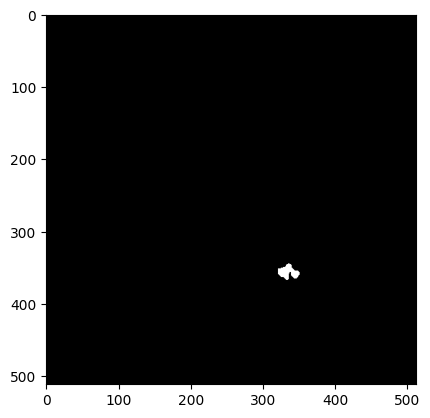

In [ ]:
plt.imshow(pred[52], cmap="gray")

In [ ]:
def display(imgs,mask):
    j = 1
    for im,mk in zip(imgs,mask):
        plt.figure(figsize=(20,300))
        plt.subplot(50,3,j)
        plt.imshow(np.squeeze(im), cmap="gray")
        plt.subplot(50,3,j+1)
        plt.imshow(np.squeeze(mk), cmap="gray")
        plt.subplot(50,3,j+2)
        plt.imshow(cv2.addWeighted(np.squeeze(im), .5, np.squeeze(mk), .5, 0), cmap="gray")
        j += 3

In [ ]:
def display2(imgs, titles=None, cmap="bone"):
    n = len(list(imgs))
    r = n//3 if n%3==0 else (n//3)+1
    plt.figure(figsize=(25,int(8*r)))
    for i,img in enumerate(imgs):
        plt.subplot(r,3,i+1)
        if titles is not None:
            plt.title(titles[i])
        plt.imshow(img, cmap=cmap)

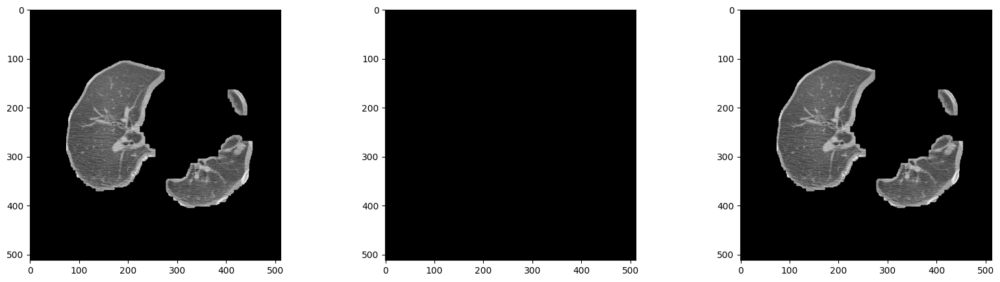

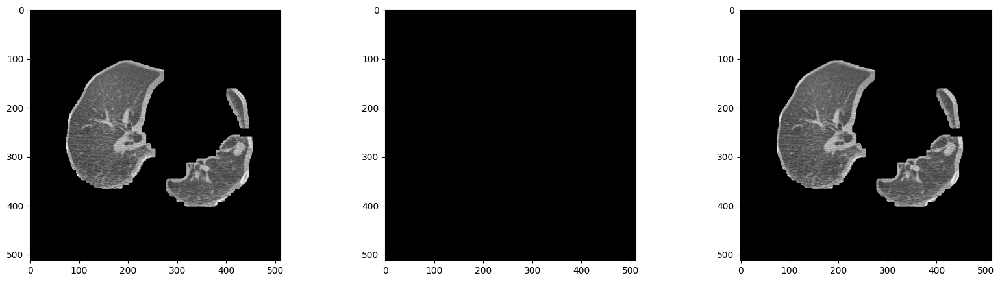

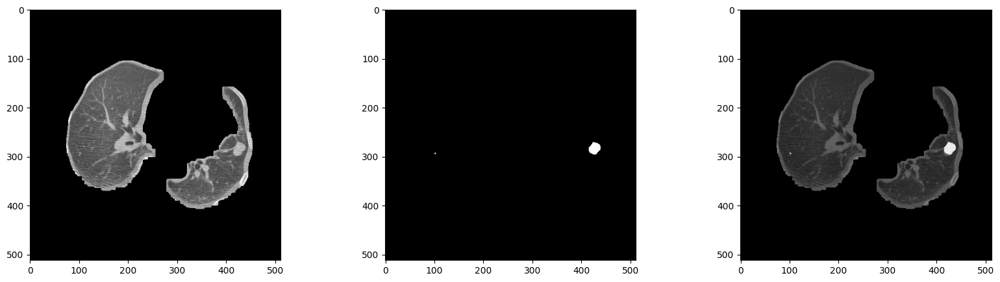

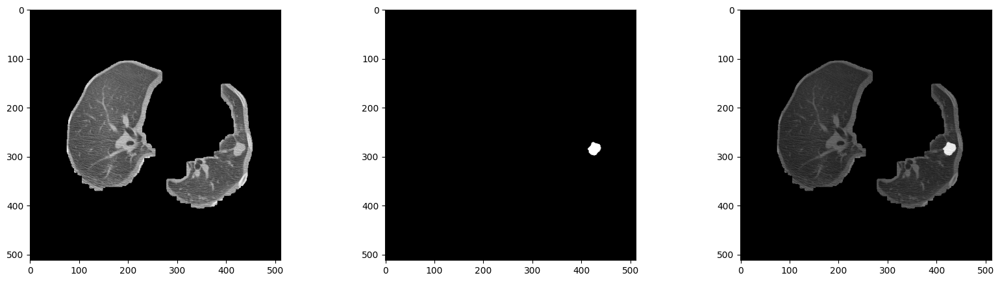

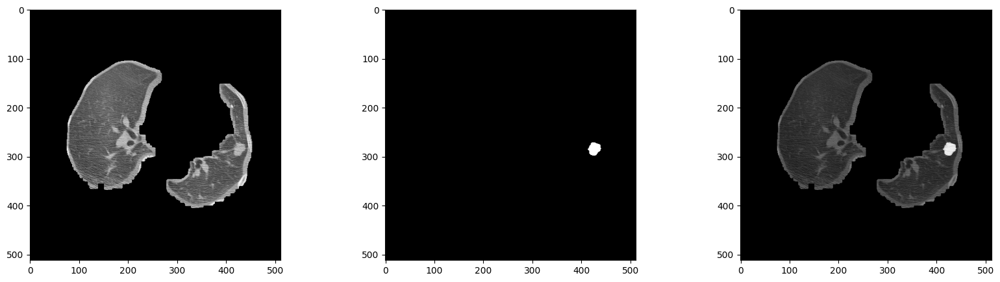

In [ ]:
display(extracted_lungs[65:70],pred[65:70])

In [ ]:
# This code is used to process the predicted masks, identify the regions in each mask,
# and extract their bounding boxes, centroids, and equivalent diameters
# for further analysis and visualization.

bboxes = []
centroids = []
diams = []
for mask in pred:
    mask = cv2.dilate(mask, kernel=np.ones((5,5)))
    labels = measure.label(mask)
    regions = measure.regionprops(labels)
    bb = []
    cc = []
    dd = []
    for prop in regions:
        B = prop.bbox
        C = prop.centroid
        D = prop.equivalent_diameter_area
        bb.append((( max(0, B[1]-8), max(0, B[0]-8) ),( min(B[3]+8, 512), min(B[2]+8, 512) )))    # ((x1,y1),(x2,y2))
        cc.append(C)    # (y,x)
        dd.append(D)
    bboxes.append(bb)
    centroids.append(cc)
    diams.append(dd)

In [ ]:
bboxes[65:71]

[[],
 [],
 [((405, 261), (449, 307)), ((91, 283), (114, 306))],
 [((403, 261), (450, 309))],
 [((403, 262), (450, 309))],
 [((400, 187), (424, 210)), ((403, 263), (449, 309))]]

In [ ]:
centroids[65:71]


[[],
 [],
 [(283.75, 426.4439393939394), (294.0, 101.87234042553192)],
 [(284.62670299727523, 426.01089918256133)],
 [(284.7877169559413, 426.01068090787714)],
 [(197.84313725490196, 411.54901960784315), (285.0, 425.8264462809917)]]

In [ ]:
bs = []
mimgs = copy.deepcopy(extracted_lungs)
for i,(img,boxes) in enumerate(zip(mimgs,bboxes)):
    for rect in boxes:
        img = cv2.rectangle(img, rect[0], rect[1], (255), 2)

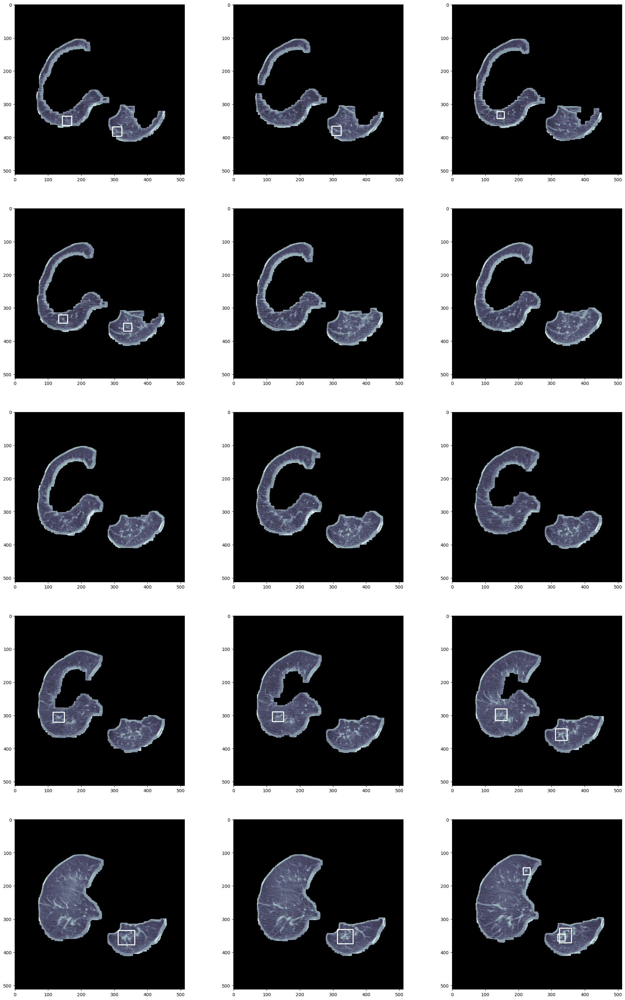

In [ ]:
display2(mimgs[40:55])

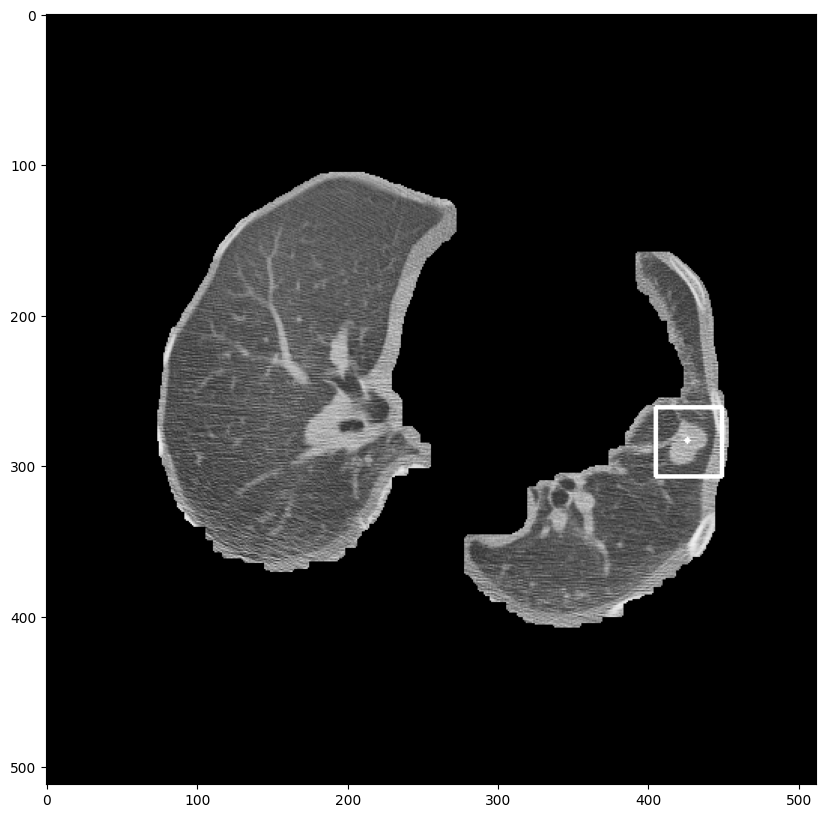

In [ ]:
idx = 67
v = copy.deepcopy(extracted_lungs)
plt.figure(figsize=(10,10))
i = cv2.rectangle(v[idx], bboxes[idx][0][0], bboxes[idx][0][1], (255), 2)
i = cv2.circle(i, (int(centroids[idx][0][1]), int(centroids[idx][0][0])), 2, (255), -1)
plt.imshow(i, cmap='gray')

In [ ]:
diams[65:71]

[[],
 [],
 [28.988585676524604, 7.735777827895049],
 [30.570538527078803],
 [30.881327999401787],
 [8.058239062071396, 30.403485153477522]]

In [ ]:
diams[67][0]*space[0]

15.90974766754015

---
Load CNN Classification Model

---

In [ ]:
fpr_model = tf.keras.models.load_model("CNN_model.h5")
#fpr_model = tf.keras.models.load_model("CNN_model_20230804_062028.h5")
#fpr_model = tf.keras.models.load_model("FPR_classifier_model.h5")
#fpr_model = tf.keras.models.load_model("checkpoint_model.h5")


In [ ]:
originals = copy.deepcopy(ct_norm_improved)
final_boxes = []
for i,(img,bbox) in enumerate(zip(originals, bboxes)):
    img_boxes = []
    for box in bbox:
        x1 = box[0][0]
        y1 = box[0][1]
        x2 = box[1][0]
        y2 = box[1][1]
        if abs(x1-x2) <=50 or abs(y1-y2)<=50:
            x = (x1+x2)//2
            y = (y1+y2)//2
            x1 = max(x-25, 0)
            x2 = min(x+25, 512)
            y1 = max(y-25, 0)
            y2 = min(y+25, 512)
            imgbox = img[y1:y2,x1:x2]
            img_boxes.append(imgbox)
        else:
            imgbox = img[y1:y2,x1:x2]
            img_boxes.append(imgbox)
    final_boxes.append(img_boxes)

In [ ]:
plt.figure(figsize=(15,15))
for i,img in enumerate(final_boxes[66]):
    plt.subplot(1,6,i+1)
    plt.imshow(img, cmap="gray")

<Figure size 1500x1500 with 0 Axes>

---
Predict For Each Slice in our data
---

In [ ]:
fpr_preds = []
for i in final_boxes:
    each_p = []
    for img in i:
        if img.shape != (50,50):
            img = np.resize(img, (50,50))
        img = img/255.
        img = np.reshape(img, (1,50,50,1))
        pred = fpr_model.predict(img)
        pred = int(pred>=0.5)
        each_p.append(pred)
    fpr_preds.append(each_p)

1/1 [==============================] - 0s 21ms/step


In [ ]:
for i in range(len(diams)):
    if len(diams[i]):
        for j in range(len(diams[i])):
            diams[i][j] = diams[i][j]*space[0]

In [ ]:
final_img_bbox = []
cancer = []
df = pd.DataFrame(columns = ['Layer', 'Position (x,y)', 'Diameter (mm)', 'BBox [(x1,y1),(x2,y2)]'])
e_lungs = copy.deepcopy(ct_norm_improved)
for i,(img,bbox,preds,cents,dms) in enumerate(zip(e_lungs, bboxes, fpr_preds, centroids, diams)):
    token = False
    for box,pred,cent,dm in zip(bbox,preds,cents,dms):
        if pred:
            x1 = box[0][0]
            y1 = box[0][1]
            x2 = box[1][0]
            y2 = box[1][1]
            img = cv2.rectangle(img, (x1,y1), (x2,y2), (255), 2)
            dct = pd.DataFrame({'Layer':i, 'Position (x,y)':[f"{cent[::-1]}"], 'Diameter (mm)':dm, 'BBox [(x1,y1),(x2,y2)]':[f"{list(box)}"]})
            df = pd.concat([df,dct], ignore_index = True)
            token = True
    final_img_bbox.append(img)
    cancer.append(token)

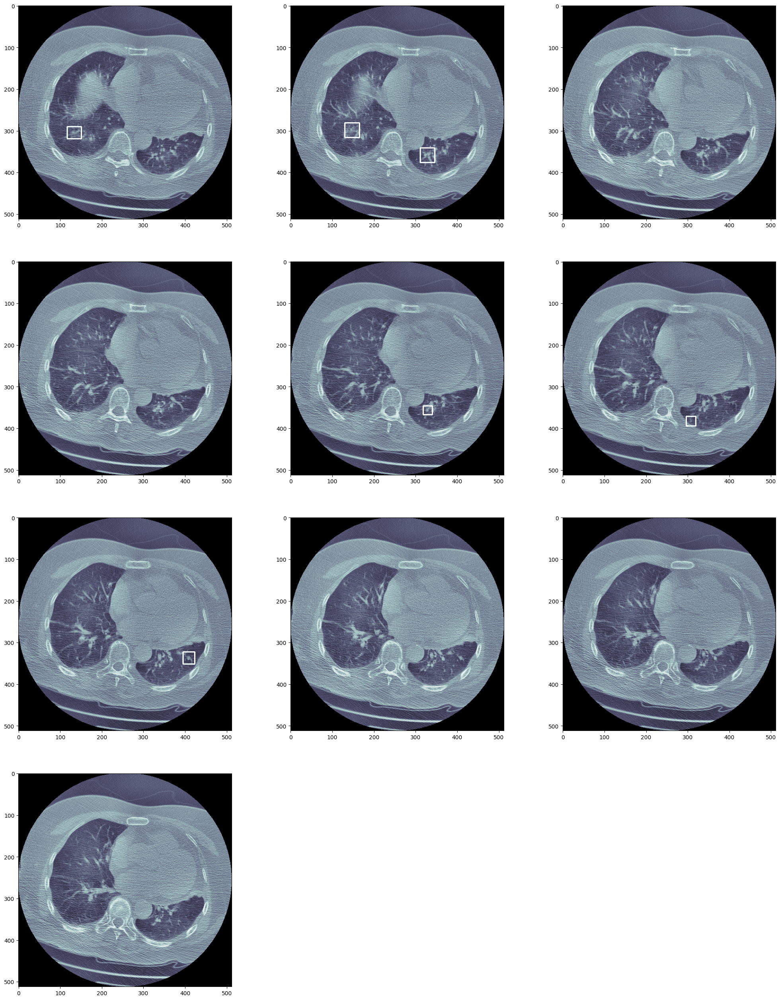

In [ ]:
display2(final_img_bbox[50:60])

___
**Final Result**
___



In [ ]:
cancer[50:60]

[True, True, False, False, True, True, True, False, False, False]

In [ ]:
df = df.reset_index(drop=True)
df.head()

,Layer,"Position (x,y)",Diameter (mm),"BBox [(x1,y1),(x2,y2)]"
0,33,"(340.9347826086956, 402.0652173913044)",4.200203,"[(330, 391), (353, 414)]"
1,34,"(340.8723404255319, 402.0)",4.245612,"[(330, 391), (353, 414)]"
2,40,"(156.80357142857142, 350.4375)",6.553908,"[(143, 337), (171, 365)]"
3,40,"(307.3252032520325, 382.5772357723577)",6.868215,"[(294, 369), (322, 397)]"
4,41,"(309.45112781954884, 380.3157894736842)",7.141956,"[(296, 367), (324, 395)]"
